In [22]:
import pandas as pd
%matplotlib inline
from matplotlib import pyplot as plt
import os
import sunpy.map
from aiapy.calibrate.prep import register as aiaprep  # sunpy.instr.aia.aiaprep was moved to aiapy
from sunpy.net import Fido, attrs as a
from astropy import units as u
import datetime
import glob
import numpy as np
from sunpy.physics.differential_rotation import solar_rotate_coordinate
import warnings
warnings.filterwarnings("ignore")

Text(0.5, 1.0, '2014-12-04T19:15:43.120')

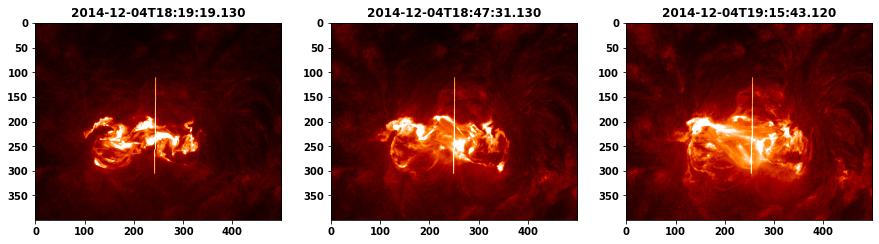

In [8]:
folder = '/Users/delbe/OneDrive - FHNW/aia_304/20141204_181904_3800100083'
files = glob.glob(folder + '/*')


aia_1 = aiaprep(sunpy.map.Map(files[0]))
aia_2 = aiaprep(sunpy.map.Map(files[len(files) // 2]))
aia_3 = aiaprep(sunpy.map.Map(files[-1]))

x1, y1 = 2842, 2705
x2, y2 = 2844, 2510


gradient = (y2-y1)/(x2-x1)
origin = y1 - gradient * x1


y = np.arange(min(y1, y2),max(y1, y2)+1)
x = (y - origin) / gradient

coords = (np.column_stack((x.round().astype(int),y.astype(int))))

plt.figure(figsize=(15,15))
plt.subplot(1, 3, 1)
aia_data = aia_1.data
im = np.clip(aia_data, 0, aia_data.max())  # clip negative values, which are "outside" the disc / corona
im = im**0.4  # gamma correction
im = np.flipud(im)

im[coords[:,1], coords[:,0]] = im.max()
plt.imshow(im[2400:2800,2600:3100], cmap=aia_1.cmap, vmax=np.percentile(im, 99.99))
plt.title(aia_1.date.isot)

skycoords = aia_1.pixel_to_world(coords[:,0] * u.pix, coords[:,1] * u.pix)
skycoords2 = solar_rotate_coordinate(skycoords, time=(aia_2.date - aia_1.date).to(u.s))
pxcoords_2 = aia_2.world_to_pixel(skycoords2)
coords2 = [pxcoords_2.y.value.round().astype('int'), pxcoords_2.x.value.round().astype('int')]  # y first (row-major)

plt.subplot(1, 3, 2)
aia_data2 = aia_2.data
im2 = np.clip(aia_data2, 0, aia_data2.max())  # clip negative values, which are "outside" the disc / corona
im2 = im2**0.4  # gamma correction
im2 = np.flipud(im2)
im2[tuple(coords2)] = im2.max()

plt.imshow(im2[2400:2800,2600:3100], cmap=aia_1.cmap, vmax=np.percentile(im2, 99.99))
plt.title(aia_2.date.isot)

# skycoords = aia_2.pixel_to_world(coords[:,0] * u.pix, coords[:,1] * u.pix)
skycoords3 = solar_rotate_coordinate(skycoords, time=(aia_3.date - aia_1.date).to(u.s))
pxcoords_3 = aia_3.world_to_pixel(skycoords3)
coords3 = [pxcoords_3.y.value.round().astype('int'), pxcoords_3.x.value.round().astype('int')]  # y first (row-major)

plt.subplot(1, 3, 3)
aia_data3 = aia_3.data
im3 = np.clip(aia_data3, 0, aia_data3.max())  # clip negative values, which are "outside" the disc / corona
im3 = im3**0.4  # gamma correction
im3 = np.flipud(im3)
im3[tuple(coords3)] = im3.max()

plt.imshow(im3[2400:2800,2600:3100], cmap=aia_1.cmap, vmax=np.percentile(im3, 99.99))
plt.title(aia_3.date.isot)

Text(0.5, 1.0, '2014-07-09T06:48:31.120')

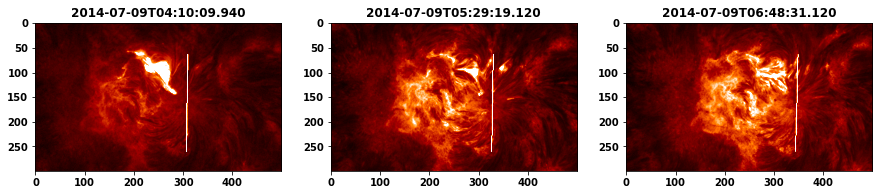

In [9]:
folder = '/Users/delbe/OneDrive - FHNW/aia_304/20140709_041000_3820256490'
files = glob.glob(folder + '/*')


aia_1 = aiaprep(sunpy.map.Map(files[0]))
aia_2 = aiaprep(sunpy.map.Map(files[len(files) // 2]))
aia_3 = aiaprep(sunpy.map.Map(files[-1]))

x1, y1, x2, y2 = 2306, 2460, 2309, 2263  

gradient = (y2-y1)/(x2-x1)
origin = y1 - gradient * x1


y = np.arange(min(y1, y2),max(y1, y2)+1)
x = (y - origin) / gradient

coords = (np.column_stack((x.round().astype(int),y.astype(int))))

plt.figure(figsize=(15,15))
plt.subplot(1, 3, 1)
aia_data = aia_1.data
im = np.clip(aia_data, 0, aia_data.max())  # clip negative values, which are "outside" the disc / corona
im = im**0.4  # gamma correction
im = np.flipud(im)

im[coords[:,1], coords[:,0]] = im.max()
plt.imshow(im[2200:2500,2000:2500], cmap=aia_1.cmap, vmax=np.percentile(im, 99.99))
plt.title(aia_1.date.isot)

skycoords = aia_1.pixel_to_world(coords[:,0] * u.pix, coords[:,1] * u.pix)
skycoords2 = solar_rotate_coordinate(skycoords, time=(aia_2.date - aia_1.date).to(u.s))
pxcoords_2 = aia_2.world_to_pixel(skycoords2)
coords2 = [pxcoords_2.y.value.round().astype('int'), pxcoords_2.x.value.round().astype('int')]  # y first (row-major)

plt.subplot(1, 3, 2)
aia_data2 = aia_2.data
im2 = np.clip(aia_data2, 0, aia_data2.max())  # clip negative values, which are "outside" the disc / corona
im2 = im2**0.4  # gamma correction
im2 = np.flipud(im2)
im2[tuple(coords2)] = im2.max()

plt.imshow(im2[2200:2500,2000:2500], cmap=aia_1.cmap, vmax=np.percentile(im2, 99.99))
plt.title(aia_2.date.isot)

# skycoords = aia_2.pixel_to_world(coords[:,0] * u.pix, coords[:,1] * u.pix)
skycoords3 = solar_rotate_coordinate(skycoords, time=(aia_3.date - aia_1.date).to(u.s))
pxcoords_3 = aia_3.world_to_pixel(skycoords3)
coords3 = [pxcoords_3.y.value.round().astype('int'), pxcoords_3.x.value.round().astype('int')]  # y first (row-major)

plt.subplot(1, 3, 3)
aia_data3 = aia_3.data
im3 = np.clip(aia_data3, 0, aia_data3.max())  # clip negative values, which are "outside" the disc / corona
im3 = im3**0.4  # gamma correction
im3 = np.flipud(im3)
im3[tuple(coords3)] = im3.max()

plt.imshow(im3[2200:2500,2000:2500], cmap=aia_1.cmap, vmax=np.percentile(im3, 99.99))
plt.title(aia_3.date.isot)

Text(0.5, 1.0, '2013-10-23T16:24:31.120')

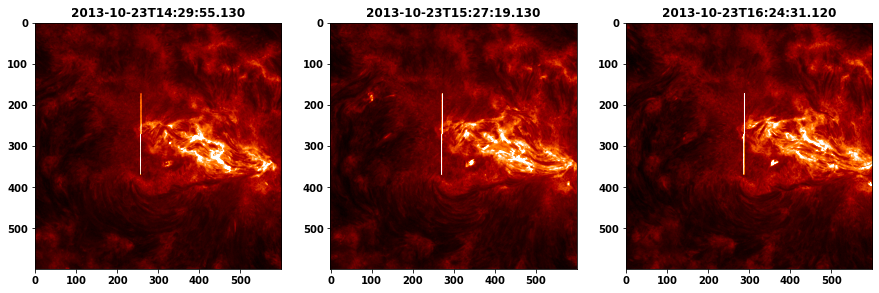

In [10]:
folder = '/Users/delbe/OneDrive - FHNW/aia_304/20131023_142944_3823251483'
files = glob.glob(folder + '/*')


aia_1 = aiaprep(sunpy.map.Map(files[0]))
aia_2 = aiaprep(sunpy.map.Map(files[len(files) // 2]))
aia_3 = aiaprep(sunpy.map.Map(files[-1]))

x1, y1, x2, y2 = 1956, 2070, 1957, 1873  

gradient = (y2-y1)/(x2-x1)
origin = y1 - gradient * x1


y = np.arange(min(y1, y2),max(y1, y2)+1)
x = (y - origin) / gradient

coords = (np.column_stack((x.round().astype(int),y.astype(int))))

plt.figure(figsize=(15,15))
plt.subplot(1, 3, 1)
aia_data = aia_1.data
im = np.clip(aia_data, 0, aia_data.max())  # clip negative values, which are "outside" the disc / corona
im = im**0.4  # gamma correction
im = np.flipud(im)

im[coords[:,1], coords[:,0]] = im.max()
plt.imshow(im[1700:2300,1700:2300], cmap=aia_1.cmap, vmax=np.percentile(im, 99.99))
plt.title(aia_1.date.isot)

skycoords = aia_1.pixel_to_world(coords[:,0] * u.pix, coords[:,1] * u.pix)
skycoords2 = solar_rotate_coordinate(skycoords, time=(aia_2.date - aia_1.date).to(u.s))
pxcoords_2 = aia_2.world_to_pixel(skycoords2)
coords2 = [pxcoords_2.y.value.round().astype('int'), pxcoords_2.x.value.round().astype('int')]  # y first (row-major)

plt.subplot(1, 3, 2)
aia_data2 = aia_2.data
im2 = np.clip(aia_data2, 0, aia_data2.max())  # clip negative values, which are "outside" the disc / corona
im2 = im2**0.4  # gamma correction
im2 = np.flipud(im2)
im2[tuple(coords2)] = im2.max()

plt.imshow(im2[1700:2300,1700:2300], cmap=aia_1.cmap, vmax=np.percentile(im2, 99.99))
plt.title(aia_2.date.isot)

# skycoords = aia_2.pixel_to_world(coords[:,0] * u.pix, coords[:,1] * u.pix)
skycoords3 = solar_rotate_coordinate(skycoords, time=(aia_3.date - aia_1.date).to(u.s))
pxcoords_3 = aia_3.world_to_pixel(skycoords3)
coords3 = [pxcoords_3.y.value.round().astype('int'), pxcoords_3.x.value.round().astype('int')]  # y first (row-major)

plt.subplot(1, 3, 3)
aia_data3 = aia_3.data
im3 = np.clip(aia_data3, 0, aia_data3.max())  # clip negative values, which are "outside" the disc / corona
im3 = im3**0.4  # gamma correction
im3 = np.flipud(im3)
im3[tuple(coords3)] = im3.max()

plt.imshow(im3[1700:2300,1700:2300], cmap=aia_1.cmap, vmax=np.percentile(im3, 99.99))
plt.title(aia_3.date.isot)

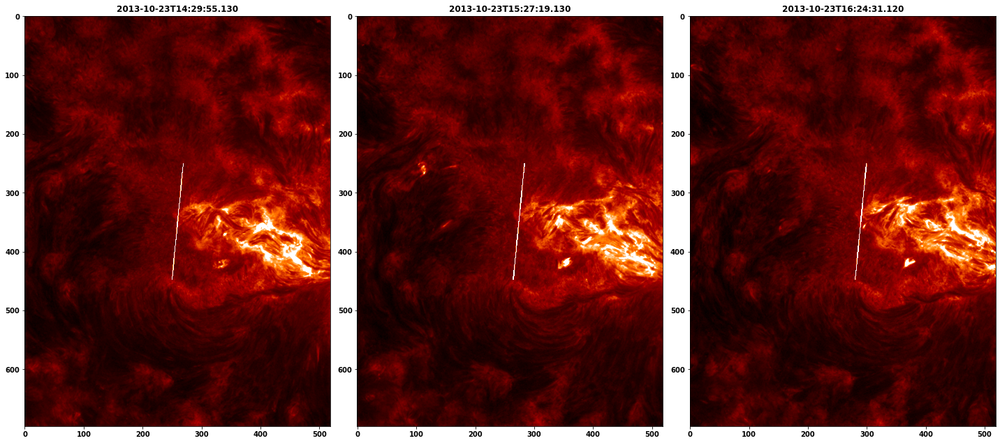

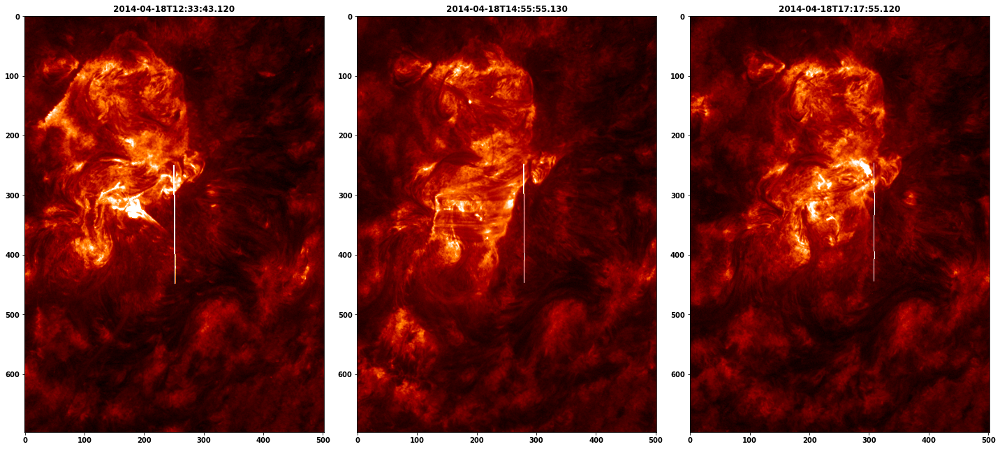

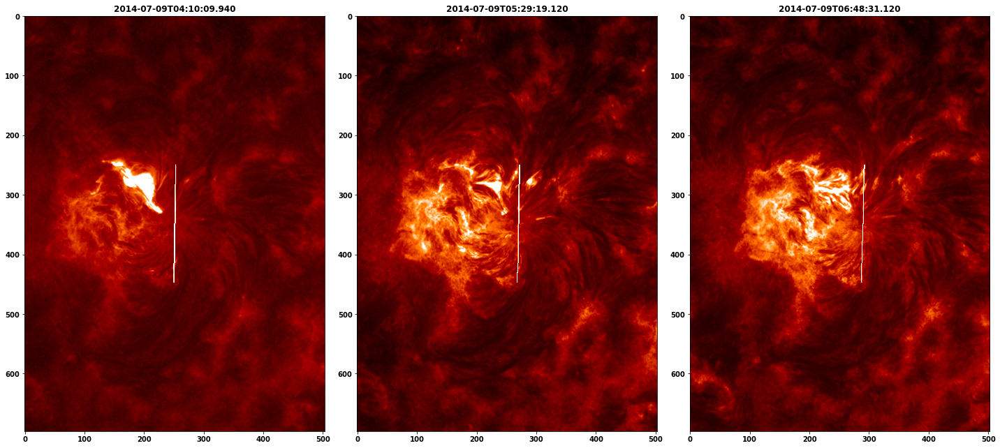

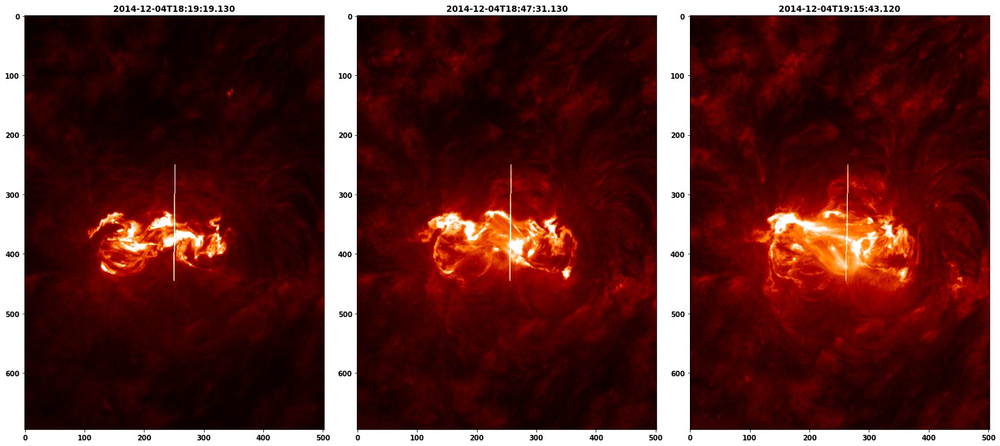

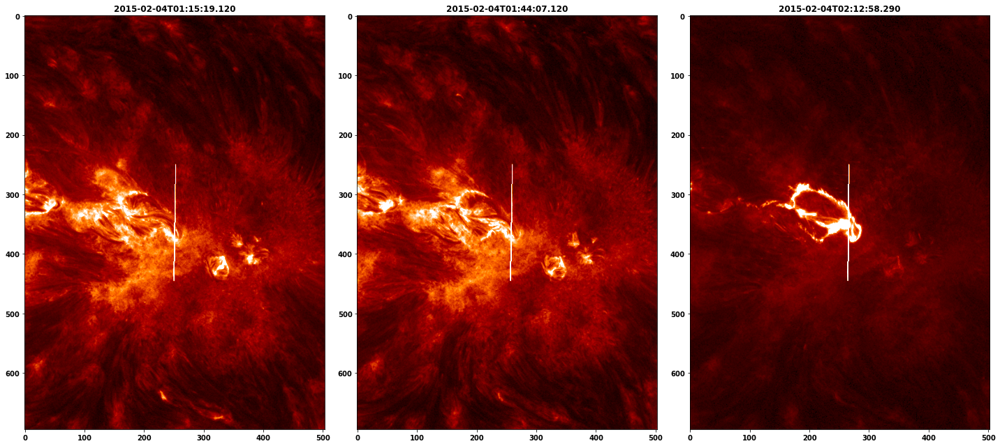

...

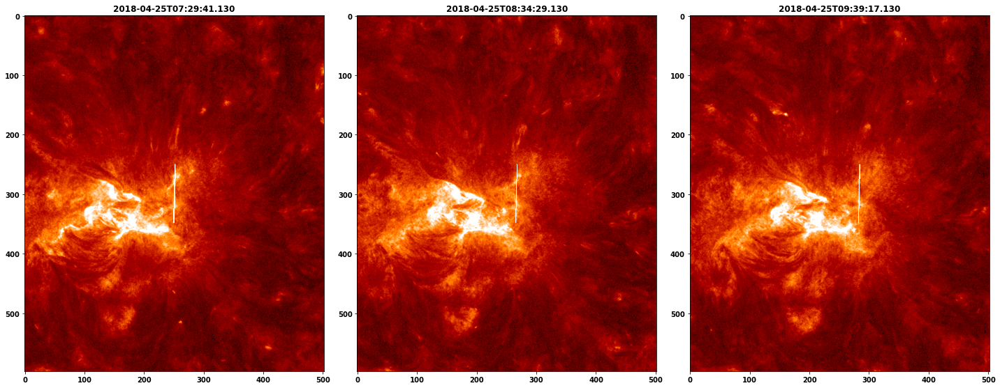

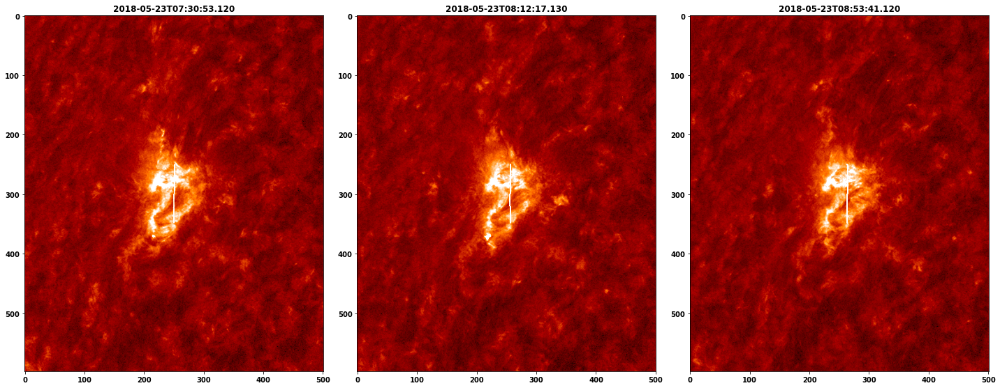

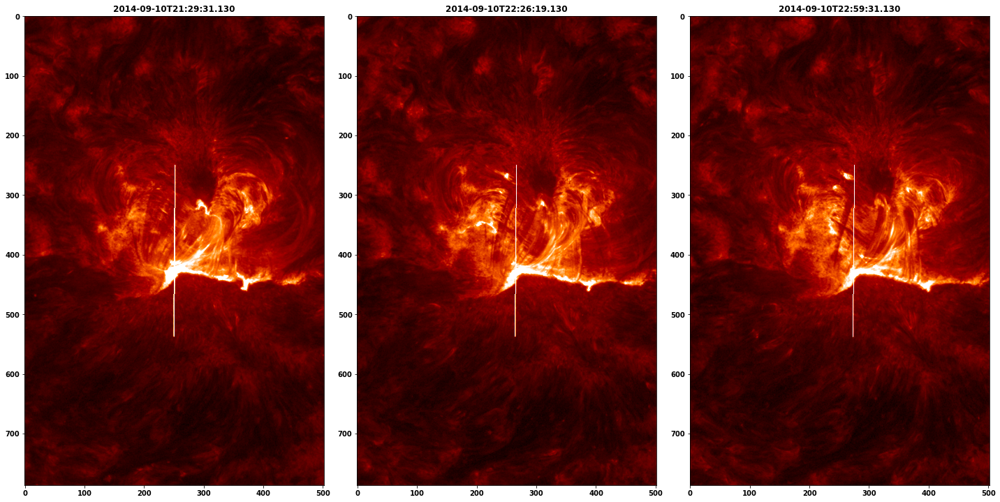

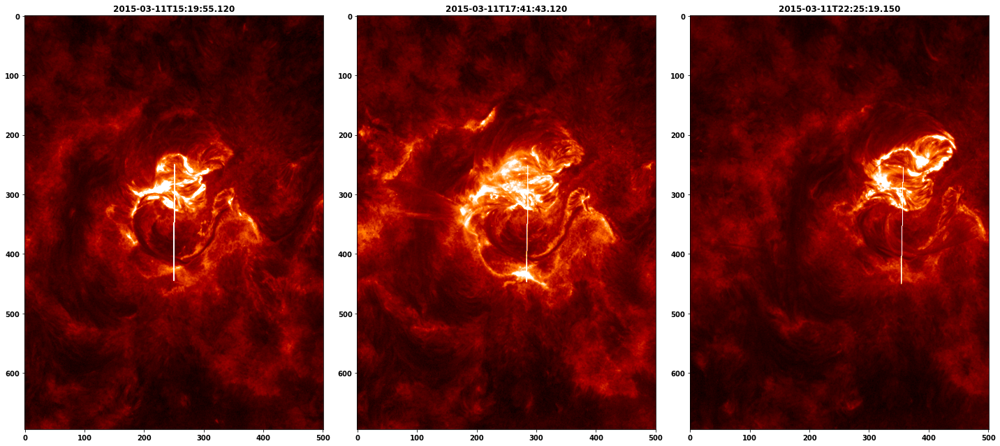

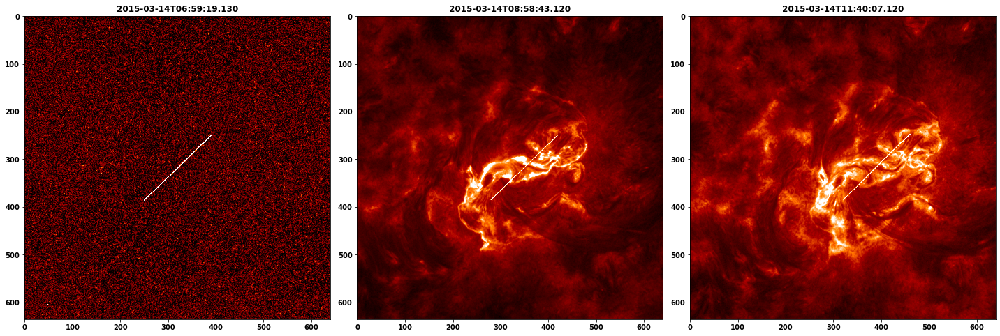

In [80]:
df = pd.read_excel('IRIS_AIA.xlsx' , sheet_name='Tabelle2')

folder = '/Users/delbe/OneDrive - FHNW/aia_304/'

for label, row in df.iterrows():
    p1_x1 = row[1]
    p1_y1 = row[2]
    p2_x2 = row[3]
    p2_y2 = row[4]

    # time_axis = row[5].split("T")

    gradient = (p2_y2-p1_y1)/(p2_x2-p1_x1)
    origin = p1_y1 - gradient * p1_x1

    y = np.arange(min(p1_y1, p2_y2),max(p1_y1, p2_y2)+1)
    x = (y - origin) / gradient

    coords = (np.column_stack((x.round().astype(int),y.astype(int))))

    files = glob.glob(folder + row[0] + "/*")
    try:

        aia_1 = aiaprep(sunpy.map.Map(files[0]))
        aia_2 = aiaprep(sunpy.map.Map(files[len(files) // 2]))
        aia_3 = aiaprep(sunpy.map.Map(files[-1]))
        
        
        top_left_x = min([p1_x1,p2_x2])
        top_left_y = min([p1_y1,p2_y2])
        bot_right_x = max([p1_x1,p2_x2])
        bot_right_y = max([p1_y1,p2_y2])

        plt.figure(figsize=(20,20))
        plt.subplot(1, 3, 1)
        aia_data = aia_1.data
        im = np.clip(aia_data, 0, aia_data.max())  # clip negative values, which are "outside" the disc / corona
        im = im**0.4  # gamma correction
        im = np.flipud(im)

        im[coords[:,1], coords[:,0]] = im.max()
        plt.imshow(im[top_left_y-250:bot_right_y + 250, top_left_x -250:bot_right_x+250],  cmap=aia_map2.cmap, vmax=np.percentile(im, 99.99))
        plt.title(aia_1.date.isot)

        skycoords = aia_1.pixel_to_world(coords[:,0] * u.pix, coords[:,1] * u.pix)
        skycoords2 = solar_rotate_coordinate(skycoords, time=(aia_2.date - aia_1.date).to(u.s))
        pxcoords_2 = aia_2.world_to_pixel(skycoords2)
        coords2 = [pxcoords_2.y.value.round().astype('int'), pxcoords_2.x.value.round().astype('int')]  # y first (row-major)

        plt.subplot(1, 3, 2)
        aia_data2 = aia_2.data
        im2 = np.clip(aia_data2, 0, aia_data2.max())  # clip negative values, which are "outside" the disc / corona
        im2 = im2**0.4  # gamma correction
        im2 = np.flipud(im2)
        im2[tuple(coords2)] = im2.max()

        plt.imshow(im2[top_left_y-250:bot_right_y + 250, top_left_x -250:bot_right_x+250],  cmap=aia_map2.cmap, vmax=np.percentile(im2, 99.99))
        plt.title(aia_2.date.isot)

        # skycoords = aia_2.pixel_to_world(coords[:,0] * u.pix, coords[:,1] * u.pix)
        skycoords3 = solar_rotate_coordinate(skycoords, time=(aia_3.date - aia_1.date).to(u.s))
        pxcoords_3 = aia_3.world_to_pixel(skycoords3)
        coords3 = [pxcoords_3.y.value.round().astype('int'), pxcoords_3.x.value.round().astype('int')]  # y first (row-major)

        plt.subplot(1, 3, 3)
        aia_data3 = aia_3.data
        im3 = np.clip(aia_data3, 0, aia_data3.max())  # clip negative values, which are "outside" the disc / corona
        im3 = im3**0.4  # gamma correction
        im3 = np.flipud(im3)
        im3[tuple(coords3)] = im3.max()

        plt.imshow(im3[top_left_y-250:bot_right_y + 250, top_left_x -250:bot_right_x+250],  cmap=aia_map2.cmap, vmax=np.percentile(im3, 99.99))
        plt.title(aia_3.date.isot)
    except: 
        continue